<a href="https://colab.research.google.com/github/fedhere/PUS2020_FBianco/blob/master/imgProcessingABC/imageprocessing1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Reading-in-and-displaying-images" data-toc-modified-id="Reading-in-and-displaying-images-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Reading in and displaying images</a></div><div class="lev2 toc-item"><a href="#Images-are-actually-arrays-of-numbers" data-toc-modified-id="Images-are-actually-arrays-of-numbers-11"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Images are actually arrays of numbers</a></div><div class="lev2 toc-item"><a href="#Conveying-colors:-each-color-channel-is-a-2D-array" data-toc-modified-id="Conveying-colors:-each-color-channel-is-a-2D-array-12"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Conveying colors: each color channel is a 2D array</a></div><div class="lev2 toc-item"><a href="#Appropriate-data-types-for-image-arrays" data-toc-modified-id="Appropriate-data-types-for-image-arrays-13"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Appropriate data types for image arrays</a></div><div class="lev1 toc-item"><a href="#Image-analysis-and-manipulation" data-toc-modified-id="Image-analysis-and-manipulation-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Image analysis and manipulation</a></div><div class="lev2 toc-item"><a href="#gamma-correction:-changing-contrast" data-toc-modified-id="gamma-correction:-changing-contrast-21"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>gamma correction: changing contrast</a></div><div class="lev2 toc-item"><a href="#reading-raw-files." data-toc-modified-id="reading-raw-files.-22"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>reading raw files.</a></div><div class="lev1 toc-item"><a href="#Extracting-areas-from-an-image" data-toc-modified-id="Extracting-areas-from-an-image-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Extracting areas from an image</a></div><div class="lev2 toc-item"><a href="#selecting-based-on-flux" data-toc-modified-id="selecting-based-on-flux-31"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>selecting based on flux</a></div><div class="lev3 toc-item"><a href="#extracting-pixel-by-thresholding-values" data-toc-modified-id="extracting-pixel-by-thresholding-values-311"><span class="toc-item-num">3.1.1&nbsp;&nbsp;</span>extracting pixel by thresholding values</a></div><div class="lev2 toc-item"><a href="#extracting-connnected-regions" data-toc-modified-id="extracting-connnected-regions-32"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>extracting connnected regions</a></div><div class="lev2 toc-item"><a href="#selecting-by-color" data-toc-modified-id="selecting-by-color-33"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>selecting by color</a></div><div class="lev2 toc-item"><a href="#Smoothing" data-toc-modified-id="Smoothing-34"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Smoothing</a></div><div class="lev2 toc-item"><a href="#Finding-edges" data-toc-modified-id="Finding-edges-35"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Finding edges</a></div><div class="lev3 toc-item"><a href="#Sobel-filter" data-toc-modified-id="Sobel-filter-351"><span class="toc-item-num">3.5.1&nbsp;&nbsp;</span>Sobel filter</a></div><div class="lev3 toc-item"><a href="#Canny-filter" data-toc-modified-id="Canny-filter-352"><span class="toc-item-num">3.5.2&nbsp;&nbsp;</span>Canny filter</a></div><div class="lev3 toc-item"><a href="#note-that-other-packages-work-differently:-for-example-the-sobel-implementation-in-sklearn.filters-already-takes-care-of-putting-the-2-dimensions-together" data-toc-modified-id="note-that-other-packages-work-differently:-for-example-the-sobel-implementation-in-sklearn.filters-already-takes-care-of-putting-the-2-dimensions-together-353"><span class="toc-item-num">3.5.3&nbsp;&nbsp;</span>note that other packages work differently: for example the sobel implementation in sklearn.filters already takes care of putting the 2 dimensions together</a></div>

In [ ]:
# your basic imports
from __future__ import print_function
import os
import sys
import numpy as np
import pylab as pl
pl.rcParams['font.size'] = 20

%pylab inline


Populating the interactive namespace from numpy and matplotlib


scipy image processing library - a  good, basic starting point

later we will import skitlearn 


In [ ]:
import scipy.ndimage as nd
# to open the image there are lots of options https://www.geeksforgeeks.org/reading-images-in-python/
import skimage.io as io

# Reading in and displaying images

## Images are actually arrays of numbers

each pixel in the image has a value associated to it. Typical encoding is 8bit - unsigned integer. range is 0-255 where 0 is darkest (black), 255 is brightest (white) if it is an 8-bit image.

In [ ]:
url = "https://github.com/fedhere/PUS2020_FBianco/blob/master/imgProcessingABC/imgs/esb.jpg?raw=true"
io.imread(url)

array([[[ 47,  77, 103],
        [ 46,  76, 102],
        [ 44,  74, 100],
        ...,
        [ 51, 104, 144],
        [ 52, 105, 145],
        [ 53, 106, 148]],

       [[ 41,  71,  97],
        [ 39,  69,  95],
        [ 37,  67,  93],
        ...,
        [ 44,  97, 137],
        [ 45,  98, 138],
        [ 45,  98, 138]],

       [[ 40,  70,  96],
        [ 38,  68,  94],
        [ 37,  67,  93],
        ...,
        [ 43,  96, 136],
        [ 44,  97, 137],
        [ 43,  96, 136]],

       ...,

       [[ 39,  77,  88],
        [ 40,  76,  90],
        [ 41,  74,  89],
        ...,
        [ 25,  53,  65],
        [ 25,  53,  65],
        [ 25,  53,  65]],

       [[ 41,  79,  90],
        [ 42,  78,  92],
        [ 42,  75,  90],
        ...,
        [ 28,  54,  67],
        [ 27,  53,  66],
        [ 27,  53,  66]],

       [[ 45,  83,  94],
        [ 45,  81,  95],
        [ 46,  79,  94],
        ...,
        [ 33,  59,  72],
        [ 32,  58,  71],
        [ 32,  58,  71]]

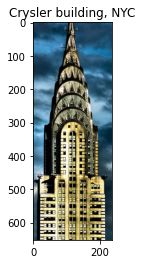

In [ ]:
imshow(io.imread(url))
pl.title("Crysler building, NYC");

## Conveying colors: each color channel is a 2D array 
images are 2D, but image files are 3D arrays (typically) with 2D array for each color channel red green and blue (RGB). More layer can exist in different color coding schemes, and if an opacity layer exist (alpha channel, for example in png format)



(-0.06999999999999999, 1.47, -0.06999999999999999, 1.47)

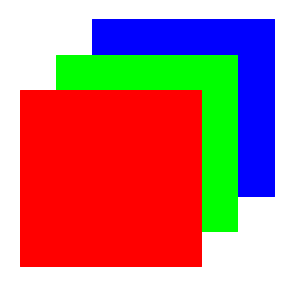

In [ ]:
ax = pl.figure(figsize=(5,5)).add_subplot(111)
pl.fill_between([0.4,1.4], [0.4,0.4], [1.4,1.4], color="#0000ff")
pl.fill_between([0.2,1.2], [0.2,0.2], [1.2,1.2], color="#00ff00")
pl.fill_between([0,1], [0,0], [1,1], color="#ff0000")
ax.axis("off")

In [ ]:

img = io.imread(url)
print ("shape of image file:", img.shape)


shape of image file: (652, 236, 3)


the first axis is the rows (652 rows in this image), the second axis the columns (236 columns) the third axis is the "channels", i.e. the color components. Here we have an RGB image: 

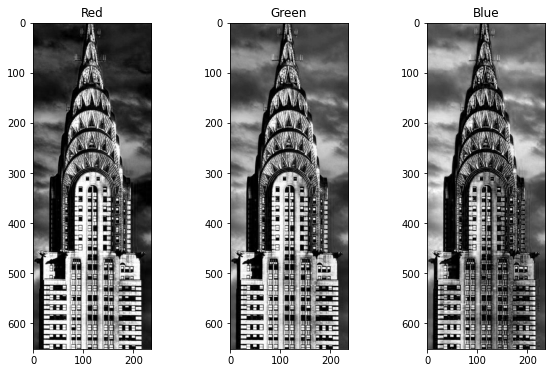

In [ ]:
fig, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize=(10,6))
# the red channel
ax1.imshow(img[:,:,0], cmap="gray")
ax1.set_title("Red")
# the green channel
ax2.imshow(img[:,:,1], cmap="gray")
ax2.set_title("Green")
# the blue channel
ax3.imshow(img[:,:,2], cmap="gray")
ax3.set_title("Blue");

let me take a second to define a utility function that suppresses the axes, the pixel number is generally unnecessary when we display an imagem

In [ ]:
def showme(image, ax=None, cmap=None, clim=None):
    '''utility function to plot image. Removes axis labels
    Arguments: 
        image: an nd array, 2D min
        ax: (optional) an pylab axis object
        cmap: (optional) a pylab color map name
        '''
    if ax is None:
        ax = pl.figure(figsize=(10,10)).add_subplot(111)
    if clim is None:
        clim = (image.min(), image.max())
    if cmap is None:
        ax.imshow(image, clim=clim)
    else:
        ax.imshow(image, cmap=cmap, clim=clim)
    ax.axis('off')
    

 showing each channel of the image separately (the channel is the tird axis)

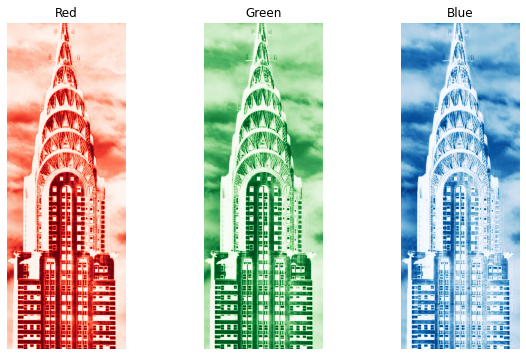

In [ ]:
fig, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize=(10,6))
showme(img[:,:,0], ax=ax1, cmap="Reds")
ax1.set_title("Red")
showme(img[:,:,1], ax=ax2, cmap="Greens")
ax2.set_title("Green")
showme(img[:,:,2], ax=ax3, cmap="Blues")
ax3.set_title("Blue");

matplotlibs know how to display a 3D array as an image, using the three channels for colors

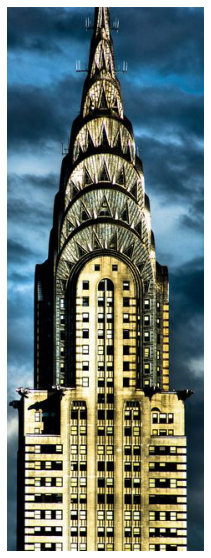

In [ ]:
showme(img)

## Appropriate data types for image arrays

generally images are encoded as arrays of 8bit unsigned integets


In [ ]:
img.dtype

dtype('uint8')

In [ ]:
print("mean by channel:", img.mean(0).mean(0))
print("max by channel:", img.max(0).max(0))
print("min by channel:", img.min(0).min(0))


mean by channel: [ 92.53650437 109.17076531 104.89339841]
max by channel: [255 255 255]
min by channel: [0 0 0]


the max unsigned integer value possible is 255. 
The value 256 in unsigned integers is actually 0! 257 is 1, -2 is 254 


In [ ]:
print(img.max(0).max(0))
print(img.min(0).min(0))

[255 255 255]
[0 0 0]


In [ ]:
print (np.uint8(256))
print (np.uint8(257))
print (np.uint8(-2))

0
1
254


If your image type is not uint8 (8-bit unsigned integer) matplotlib will not show it correctly.
Note that this is a display issue, not an inherent issue though! - your scientific images can contain float values and be more different than a 1/255th if your sensors allow that resolution.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


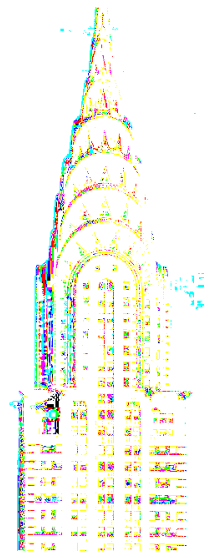

In [ ]:
showme(img.astype(float))

max double image: [254 254 254]


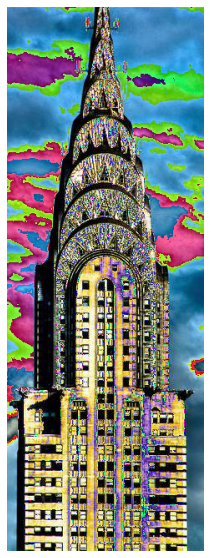

In [ ]:
print ("max double image:", (img * 2).max(0).max(0))
showme(img*2)

but if the floating point range is [0-1] then matplotlib knows how to display it

min 0.0 max 1.0 float64


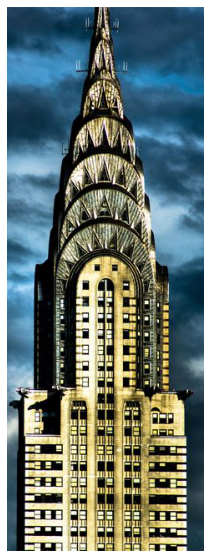

In [ ]:
img_ = img.astype(float) / (img.astype(float)).max()
print ("min", img_.min(), "max", img_.max(), img_.dtype)
showme(img_)

# Image analysis and manipulation

AKA your own private instagram

In [ ]:
from google.colab import drive
from IPython.display import Image
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd /content/drive/Shareddrives/PUS2020/

/content/drive/Shareddrives/PUS2020


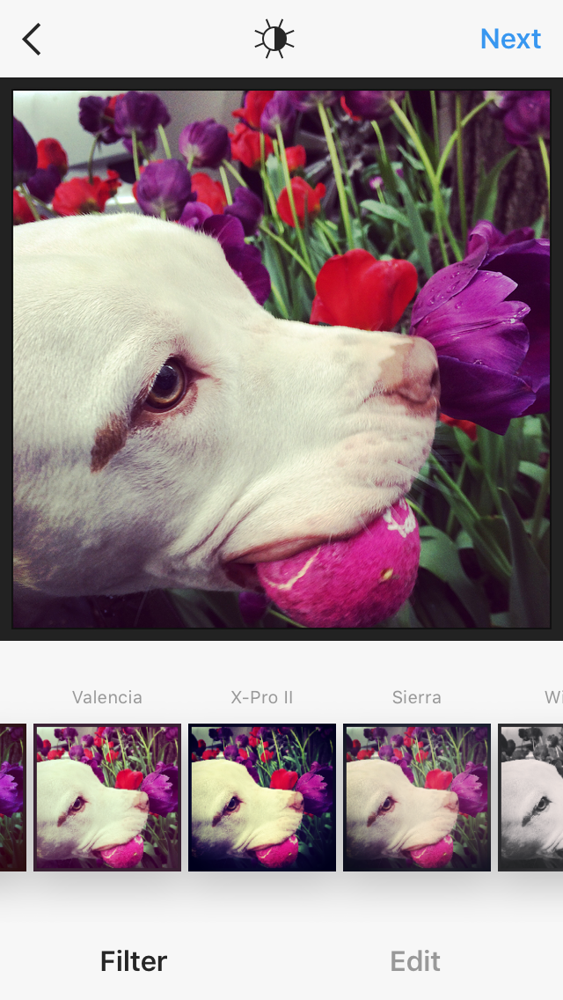

In [ ]:
Image("data/igfilters.png", width = 300)

## gamma correction: changing contrast


mathematically, to change the contrast I would take all the values of the image to some power. 

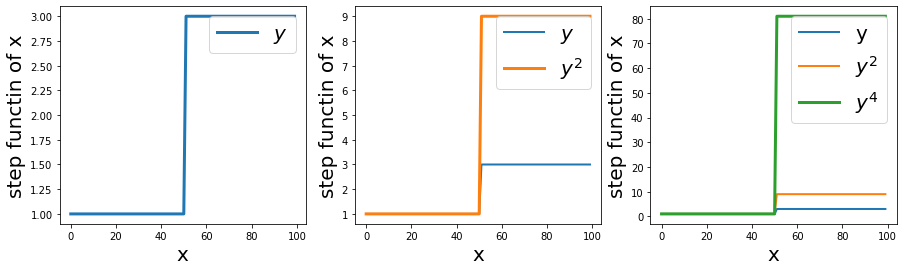

In [ ]:
x = np.arange(100)
y = 1.0 + (x > 50) * 2

fig = pl.figure(figsize=(15,4))
ax1 = fig.add_subplot(131)
pl.plot(x, y, label="$y$", lw=3)
pl.xlabel("x", fontsize=20)
pl.ylabel("step functin of x", fontsize=20)
pl.legend(fontsize=20)
ax1 = fig.add_subplot(132)
pl.plot(x, y, label="$y$", lw=2)
pl.plot(x, y**2, label=r"$y^2$", lw=3)
pl.xlabel("x", fontsize=20)
pl.ylabel("step functin of x", fontsize=20)
pl.legend(fontsize=20)
ax1 = fig.add_subplot(133)
pl.plot(x, y, label="y", lw=2)
pl.plot(x, y**2, label=r"$y^2$", lw=2)
pl.plot(x, y**4, label=r"$y^4$", lw=3)
pl.xlabel("x", fontsize=20)
pl.ylabel("step functin of x", fontsize=20)
pl.legend(fontsize=20);

you must make sure you change the data types appropriately while you manipulate image values

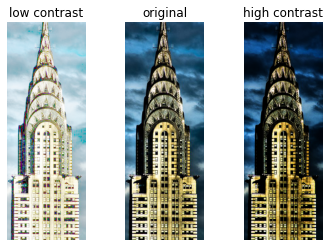

In [ ]:
fig = pl.figure()
# a power < 1 (here 0.2) lowers the contrast
imgsq = img.astype(float)**0.2

#normalize: reset range to 0-255
imgsq *= 255 / imgsq.max()
showme(imgsq.astype(np.uint8), ax=fig.add_subplot(131))
pl.title("low contrast")

#original contrast
showme(img, ax=fig.add_subplot(132))
pl.title("original")

imgsq = img.astype(float)**2
# a power > 1 (here 2) highers the contrast
imgsq *= 255 / imgsq.max()
showme(imgsq.astype(np.uint8), ax=fig.add_subplot(133))
title = pl.title("high contrast")

remember that matplotlib can also display correctly floating point arrays if they are in the range [0,1]

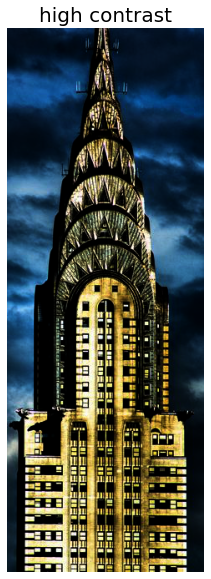

In [ ]:
imgsq /= imgsq.max()
showme(imgsq)
title = pl.title("high contrast", fontsize=20)

 sklearn provides a function which does rescaling and converting to uint8

[[[0.03397155 0.09118032 0.16315263]
  [0.03254133 0.08882737 0.16      ]
  [0.02977316 0.08421376 0.153787  ]
  ...
  [0.04       0.16633602 0.31889273]
  [0.04158401 0.16955017 0.32333718]
  [0.04319877 0.17279508 0.33685506]]

 [[0.0258516  0.07752403 0.14469819]
  [0.023391   0.07321799 0.13879277]
  [0.02105344 0.06903499 0.13301038]
  ...
  [0.02977316 0.14469819 0.28864283]
  [0.03114187 0.14769704 0.29287197]
  [0.03114187 0.14769704 0.29287197]]

 [[0.02460592 0.07535563 0.1417301 ]
  [0.02220684 0.07111111 0.1358862 ]
  [0.02105344 0.06903499 0.13301038]
  ...
  [0.02843522 0.1417301  0.28444444]
  [0.02977316 0.14469819 0.28864283]
  [0.02843522 0.1417301  0.28444444]]

 ...

 [[0.023391   0.09118032 0.11909266]
  [0.02460592 0.08882737 0.12456747]
  [0.0258516  0.08421376 0.12181469]
  ...
  [0.00961169 0.04319877 0.06497501]
  [0.00961169 0.04319877 0.06497501]
  [0.00961169 0.04319877 0.06497501]]

 [[0.0258516  0.09597847 0.12456747]
  [0.02712803 0.09356401 0.13016532]


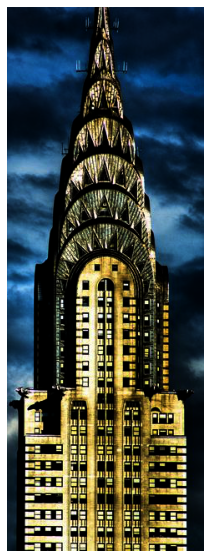

In [ ]:
from skimage.exposure import rescale_intensity
imgsq = img.astype(float)**2
print (rescale_intensity(imgsq))
showme(rescale_intensity(imgsq))


# Extracting areas from an image

## selecting based on flux 


From a black and white image, lets select the brightest lights

In [ ]:
rawimg = io.imread("https://github.com/fedhere/PUS2020_FBianco/blob/master/imgProcessingABC/imgs/1-new-york-city-1270751697.jpg?raw=true")

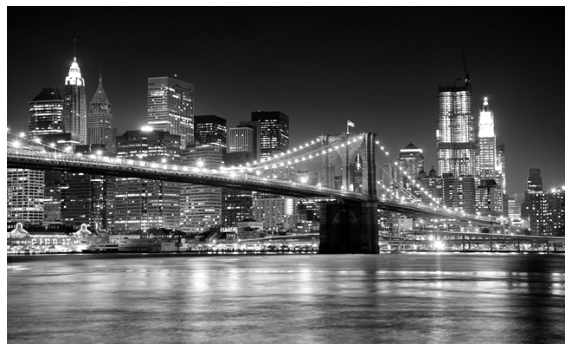

In [ ]:
# turn  out last image B/W
bwrawimg = (rawimg.reshape([390,645,3]).sum(2) / 3.)
bwrawimg /= bwrawimg.max()
showme(bwrawimg, cmap="gray")

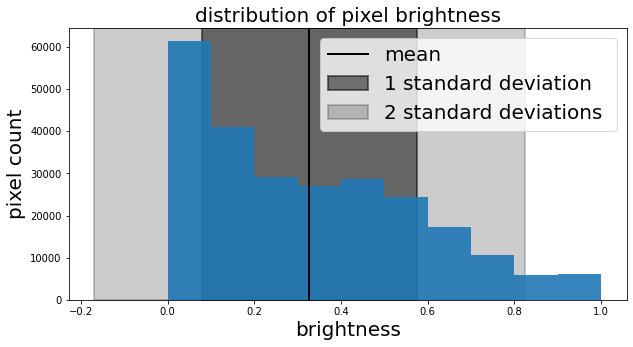

In [ ]:
ax = pl.figure(figsize=(10,5)).add_subplot(111)
hist = ax.hist(bwrawimg.flatten(), alpha=0.9)

ax.set_ylim(ax.get_ylim()) #fix ylim so it does not get rescaled
ax.plot([bwrawimg.flatten().mean(), bwrawimg.flatten().mean()], ax.get_ylim(),
        lw=2, color='k', label="mean")
fill = ax.fill_betweenx(ax.get_ylim(), bwrawimg.flatten().mean() - 
                        bwrawimg.flatten().std(), bwrawimg.flatten().mean() + 
                        bwrawimg.flatten().std(), lw=2, color='k', 
                        alpha=0.5, label="1 standard deviation ")
fill = ax.fill_betweenx(ax.get_ylim(), bwrawimg.flatten().mean() - 2.0 * 
                        bwrawimg.flatten().std(), bwrawimg.flatten().mean() +
                        2.0 * bwrawimg.flatten().std(), lw=2, 
                        color='k', alpha=0.2, label="2 standard deviations ")
pl.title("distribution of pixel brightness", fontsize=20)
pl.xlabel("brightness", fontsize=20); pl.ylabel("pixel count", fontsize=20)
pl.legend(fontsize=20);

remember: 0 is dark, 1 is bright. 

setting everything above a threshold to 1 means setting it to white.

setting everything below a threshold to 0 means setting it to black. 

### extracting pixel by thresholding values 

In [ ]:
bwrawimg = (rawimg.reshape([390,645,3]).sum(2) / 3.)
bwrawimg /= bwrawimg.max()

# setting all pixels that are in or above the dark gray box (mean - 1 sigma) to 0
# doing this by slicing original array
bwrawimg[bwrawimg > bwrawimg.flatten().mean() - bwrawimg.flatten().std()] = 1.
print (bwrawimg)

[[0.01045752 0.01045752 0.01045752 ... 0.01045752 0.01045752 0.01045752]
 [0.0130719  0.0130719  0.01045752 ... 0.01045752 0.01045752 0.01045752]
 [0.0130719  0.0130719  0.01045752 ... 0.01045752 0.01045752 0.01045752]
 ...
 [1.         1.         1.         ... 1.         1.         1.        ]
 [1.         1.         1.         ... 1.         1.         1.        ]
 [1.         1.         1.         ... 1.         1.         1.        ]]


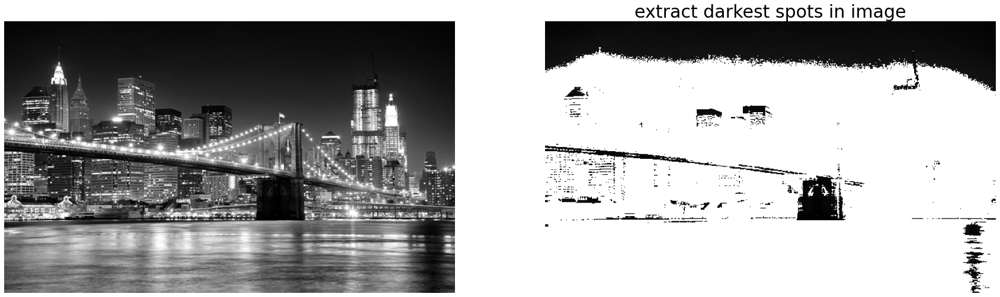

In [ ]:
fig, (ax1, ax2) = pl.subplots(1, 2, figsize=(30,10))
showme((rawimg.reshape([390,645,3]).sum(2) / 3.), ax=ax1, cmap="gray")
showme(bwrawimg, ax=ax2, cmap="gray")
title = pl.title('extract darkest spots in image', fontsize=30)

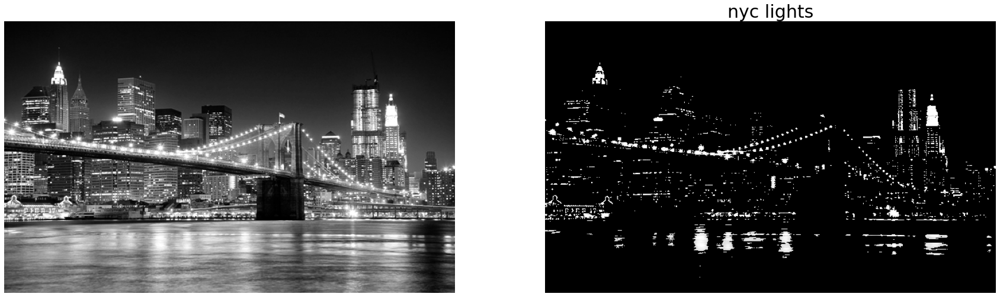

In [ ]:
bwrawimg = (rawimg.reshape([390,645,3]).sum(2) / 3.)
bwrawimg /= bwrawimg.max()
# setting all pixels that are above mean + 2 standard deviations (above pale gray box)
bwrawimg[bwrawimg < bwrawimg.flatten().mean() + 2.0 * bwrawimg.flatten().std()] = 0
fig, (ax1, ax2) = pl.subplots(1, 2, figsize=(30,10))
showme((rawimg.reshape([390,645,3]).sum(2) / 3.), ax=ax1, cmap="gray")
showme(bwrawimg, ax=ax2, cmap="gray")
title = pl.title('nyc lights', fontsize=30)


## extracting connnected regions

In [ ]:
#single channel (b/w)
bwrawimg = (rawimg.reshape([390,645,3]).sum(2) / 3.)
bwrawimg /= bwrawimg.max()

#select pixels above threshold
mask = bwrawimg > bwrawimg.mean() + 2.0 * bwrawimg.flatten().std()
# mask is an array of binary values (0/1 or True/False)
mask

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

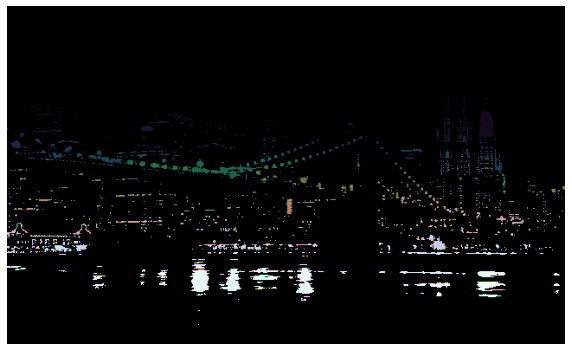

In [ ]:
# nd.lables identifies regions of the mask that are contiguous. each region gets a label (a number)
label_im, nb_labels = nd.label(mask)
nb_labels # how many regions?
showme(label_im, cmap=plt.cm.get_cmap('cubehelix', nb_labels))      

all label values (mostly 0's!): [[   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 ...
 [   0    0    0 ...    0    0 1058]
 [   0    0    0 ...    0    0 1058]
 [   0    0    0 ...    0    0 1058]]
all non-zero  label in fragment: [ 539  550  567  568  569  579  584  585  592  593  594  605  606  607
  609  621  622  623  633  634  648  675  676  682  693  694  704  705
  732  739  745  762  766  767  768  779  789  790  791  792  799  808
  815  822  870  871  872  873  874  875  881  908  928  929  934  935
  938  948  973  977  996 1009 1011 1057 1058 1091 1092 1093]
number of unique labels in fragment: 68


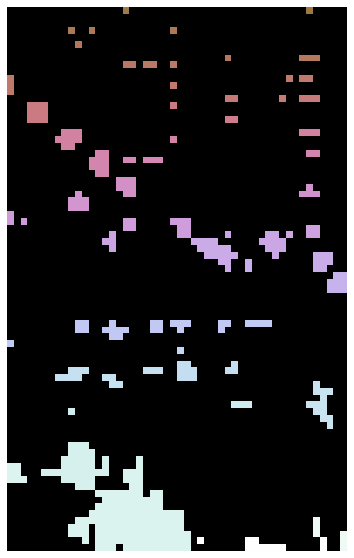

In [ ]:
cm = plt.cm.get_cmap('cubehelix', nb_labels)
showme(label_im[200:280,480:530], cmap=plt.cm.get_cmap('cubehelix', nb_labels))
print ("all label values (mostly 0's!):", label_im[200:280,480:530])
print ("all non-zero  label in fragment:", np.unique(label_im[200:280,480:530][label_im[200:280,480:530]>0])) 
print ("number of unique labels in fragment:", 
       np.unique(label_im[200:280,480:530][label_im[200:280,480:530]>0]).shape[0])

## selecting by color

selecting pixels that are predominantly blue: remember RGB: Blue is the 3rd channel (index=2)

In [ ]:
#pixels that are greener (G=1) than they are blue
(img[:,:,2] < img[:,:,1])

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [ ]:
#pixels that are redder (R=2) than they are blue
(img[:,:,2] < img[:,:,0])

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [ ]:
#pixels that are redder or greener than they are blue
(img[:,:,2] < img[:,:,0]) * (img[:,:,2] < img[:,:,1])

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

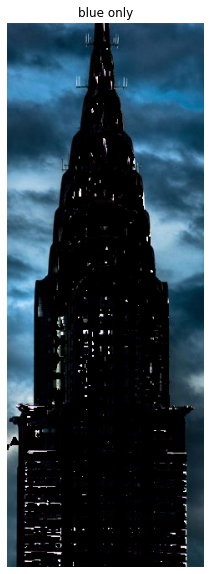

In [ ]:
# set them to 0 and show the rest
skyfiImg = img.copy()
skyfiImg[(img[:,:,2] < img[:,:,1]) * (img[:,:,2] < img[:,:,0])] = 0
showme(skyfiImg)
title = pl.title('blue only')

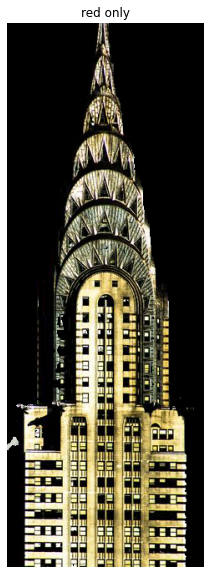

In [ ]:
#get predominantly red pixels only
redImg = img.copy()
redImg[(img[:,:,0] < img[:,:,1]) * (img[:,:,0] < img[:,:,2])] = 0
showme(redImg)
title = pl.title('red only')

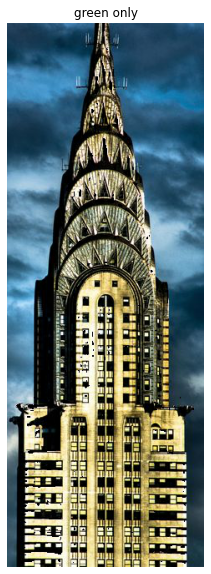

In [ ]:
#get predominantly green pixels only
greenImg = img.copy()
greenImg[(img[:,:,1] < img[:,:,0]) * (img[:,:,1] < img[:,:,2])] = 0
showme(greenImg)
title = pl.title('green only')

## Smoothing

We used smmoothing for time series before: 

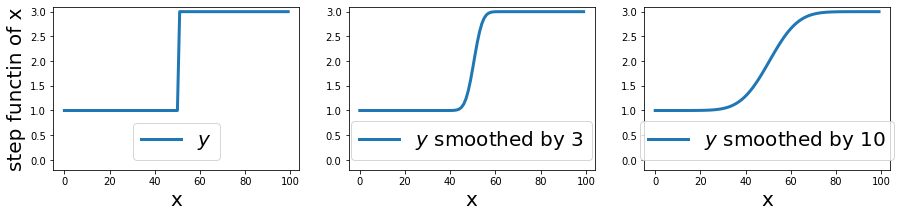

In [ ]:
x = np.arange(100)
y = 1.0 + (x > 50) * 2

fig, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize=(15,3))
ax1.plot(x, y, label="$y$", lw=3)
ax1.set_xlabel("x", fontsize=20)
ax1.set_ylabel("step functin of x", fontsize=20)
ax1.set_ylim(-0.2, 3.1)
ax1.legend(fontsize=20, loc=8)

ysmooth3 = nd.filters.gaussian_filter(y, 3)
ax2.plot(x, ysmooth3, label="$y$ smoothed by 3", lw=3)
ax2.set_xlabel("x", fontsize=20)
ax2.set_ylim(-0.2, 3.1)
ax2.legend(fontsize=20, loc=8);

ysmooth10 = nd.filters.gaussian_filter(y, 10)
ax3.plot(x, ysmooth10, label="$y$ smoothed by 10", lw=3)
ax3.set_xlabel("x", fontsize=20)
ax3.set_ylim(-0.2, 3.1)
ax3.legend(fontsize=20, loc=8);


same thing in 2D

notice because of its stochastic nature can be smoothed!

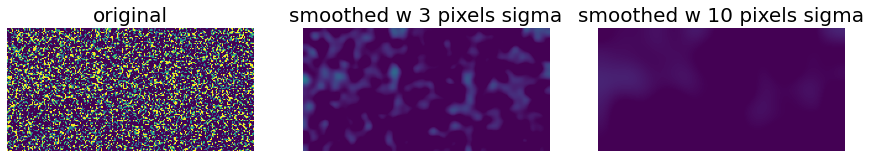

In [ ]:
np.random.seed(111)

fig = pl.figure(figsize=(15,4))
img_ = np.random.randn(100, 200)

ax = fig.add_subplot(131)
showme(img_, ax=ax, clim=(0,1))
pl.title("original", fontsize=20)
ax = fig.add_subplot(132)
showme(nd.filters.gaussian_filter(img_, (3,3)), ax=ax, clim=(0,1))
pl.title("smoothed w 3 pixels sigma", fontsize=20)
ax = fig.add_subplot(133)
pl.title("smoothed w 10 pixels sigma", fontsize=20)
showme(nd.filters.gaussian_filter(img_, (10,10)), ax=ax, clim=(0,1))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


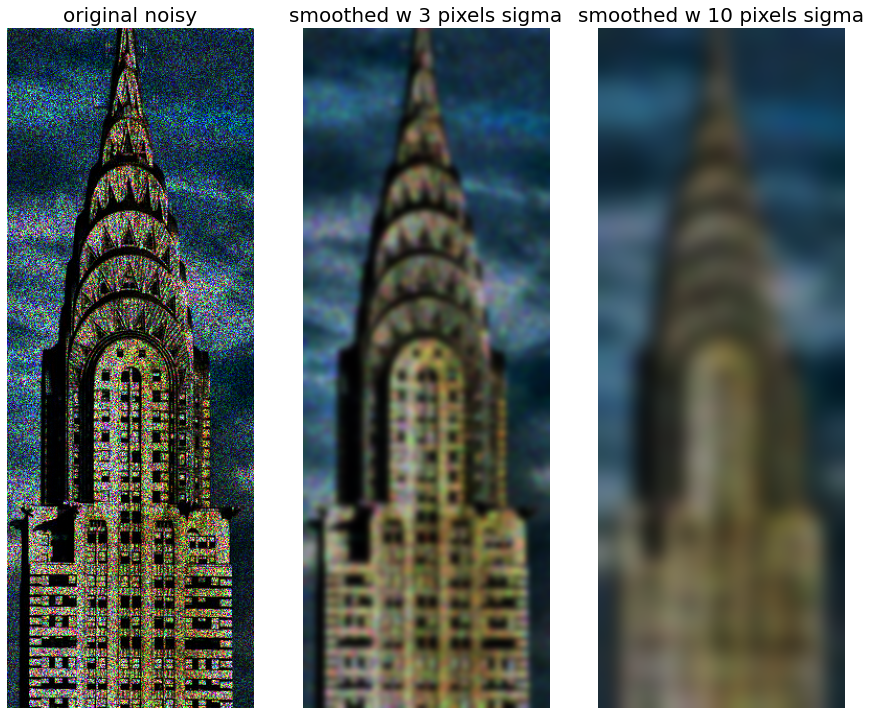

In [ ]:
csb = io.imread(url) 
img_ = csb.astype(float) * np.abs(np.random.randn(*csb.shape) * 0.01) 
img_ /= img_.max(0).max(0).shape

fig = pl.figure(figsize=(15,40))

ax = fig.add_subplot(131)
showme(img_, ax=ax, clim=(0,1))
pl.title("original noisy", fontsize=20)
ax = fig.add_subplot(132)
showme(nd.filters.gaussian_filter(img_, (3,3,0)), ax=ax, clim=(0,1))
pl.title("smoothed w 3 pixels sigma", fontsize=20)
ax = fig.add_subplot(133)
pl.title("smoothed w 10 pixels sigma", fontsize=20)
showme(nd.filters.gaussian_filter(img_, (10,10,0)), ax=ax, clim=(0,1))

## Finding edges 

### Sobel filter

the Sobel filter (really Sobel–Feldman, Sobel and Feldman 1968) is finds edges by taking the gradient (derivative vector) of the image. The derivative is taken along a specific axis. 

What is the derivative??

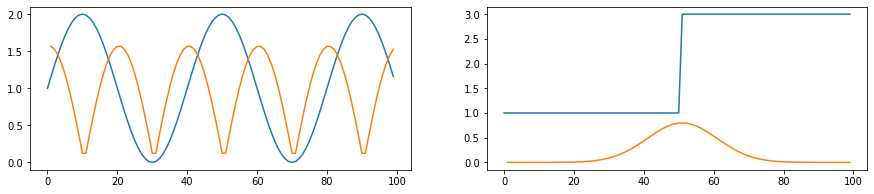

In [ ]:
fig, (ax1, ax2) = pl.subplots(1, 2, figsize=(15,3))
ysin = np.sin(x / 20. * np.pi) + 1
dy = np.abs(ysin[1:] - ysin[:-1])
ax1.plot(x, ysin)
ax1.plot(x[1:], dy * 10);

#cheap computational derivative y - y shifted by one step
dy = np.abs(ysmooth10[1:] - ysmooth10[:-1])
ax2.plot(x, y)
ax2.plot(x[1:], dy * 10)

In [ ]:
def sobelall(img, smooth=True):
    '''calculates and plots the sobel filter of an image
    Arguments:
        img: a 2d or 3d numpy array (from an image file). If 3D the third dimension shoudl be 3 for RGB
        smooth: bool. If True the image is smoothed with Gaussian kernel w sigma = 5 pixels
    '''
    
    fig, (ax1, ax2, ax3, ax4, ax5) = pl.subplots(1, 5, figsize=(30,15))
    showme(img, ax=ax1, cmap="viridis")
    title = ax1.set_title("original", fontsize=20);
    ax = 1
    
    # checking if  this is color or BW image (2D or 3D)
    if len(img.shape) == 3:
        ax = 2

    # adding option to smooth the image before using sobel filter
    if smooth:
        if ax == 2:
            img = nd.filters.gaussian_filter(img, [5,5,0])
        else:
            img = nd.filters.gaussian_filter(img, [5,0])
        showme(img, ax=ax1, cmap="viridis")
        title = ax1.set_title("smoothed", fontsize=20);
        
    # apply sobel filter along  y axis
    sx = nd.filters.sobel(img, 0)
    if ax == 2:
        # color image
        showme(sx.mean(ax), ax=ax2, cmap="Greys")
        ax2.set_title("y-axis sobel", fontsize=20);
        # apply sobel filter along  x axis 
        sy = nd.filters.sobel(img, 1)
        showme(sy.mean(ax), ax=ax3, cmap="Greys")
    else: 
        # bw image
        showme(sx, ax=ax2, cmap="Greys")
        ax2.set_title("y-axis sobel", fontsize=20);
        # apply sobel filter along  x axis         
        sy = nd.filters.sobel(img, 1)
        showme(sy, ax=ax3, cmap="Greys")
        
    title = ax3.set_title("x-axis sobel", fontsize=20);
    
    # combining x and y sobel filter (there are other ways to do this!)
    mag = np.sqrt(sx**2 + sy**2).astype(float)
    mag *= 255.0 / numpy.max(mag)  # normalize (Q&D)

    #plot result
    if ax == 2:
        showme(mag.astype(np.uint8).mean(2), ax=ax4, cmap="Greys")
        tmp = mag.astype(np.uint8).mean(2)
    else:
        showme(mag.astype(np.uint8), ax=ax4, cmap="Greys")
        tmp = mag.astype(np.uint8)
        
    title = ax4.set_title("combined x-y axis filters", fontsize=20)
    # plot enhanced result
    tmp[tmp < 1] = 0
    tmp[tmp > 100] = 255
    showme(tmp, ax=ax5, cmap="Greys")
    title = ax5.set_title("sobel filter enhanched", fontsize=20)

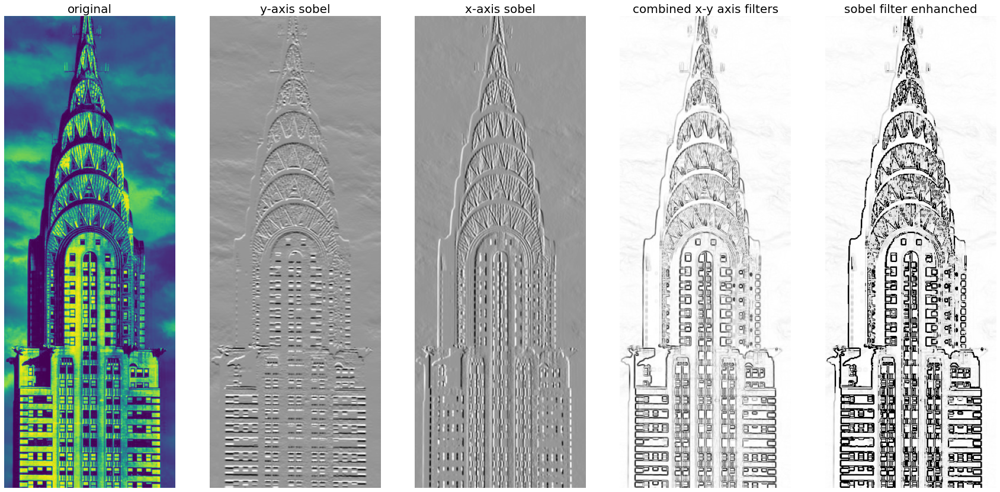

In [ ]:

sobelall(io.imread(url).mean(2), smooth=False)

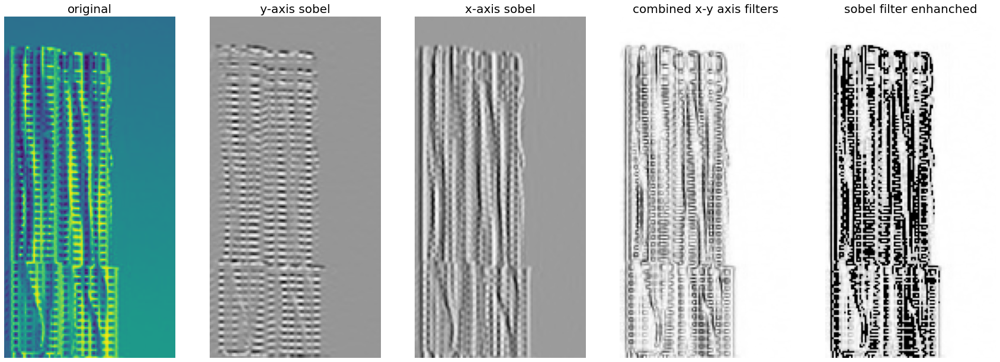

In [ ]:
gehryimfile = "https://github.com/fedhere/PUS2020_FBianco/blob/master/imgProcessingABC/imgs/New-York-by-Gehry-1-537x368.jpg?raw=true"
sobelall(io.imread(gehryimfile)[0:200,150:250].mean(2), smooth=False)


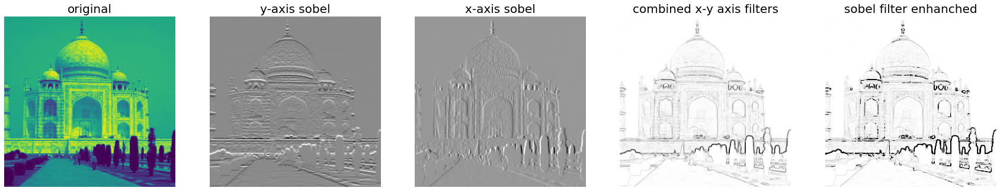

In [ ]:
tgimfile = 'https://github.com/fedhere/PUS2020_FBianco/blob/master/imgProcessingABC/imgs/taj_orig.jpg?raw=true'
sobelall(io.imread(tgimfile).mean(2), smooth=False)

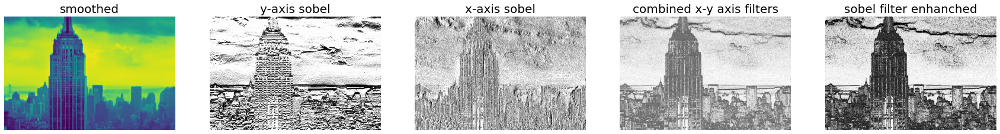

In [ ]:
empimfile = "https://github.com/fedhere/PUS2020_FBianco/blob/master/imgProcessingABC/imgs/NYCskyline.jpg?raw=true"
sobelall(io.imread(empimfile))

### Canny filter

it includes smoothing by a gaussian kernel with width sigma, sobel filtering along x and y, and combining the filters, and typically allows thresholds to be set

steps: 

- Apply Gaussian filter to smooth the image in order to remove the noise
- Find the intensity gradients of the image
- Apply non-maximum suppression to get rid of spurious response to edge detection
- Apply double threshold to determine potential edges
- Track edge by hysteresis: Finalize the detection of edges by suppressing all the other edges that are weak and not connected to strong edges.

In [ ]:
from skimage import feature

In [ ]:

def cannyall(im, sig=5):
    edges1 = feature.canny(im)
    edges2 = feature.canny(im, sigma=sig)

    # display results
    fig, (ax1, ax2, ax3) = pl.subplots(nrows=1, ncols=3, figsize=(10, 5), 
                                    sharex=True, sharey=True)
    ax1.imshow(im, cmap="viridis")
    ax1.axis('off')
    ax1.set_title('noisy image', fontsize=20)

    ax2.imshow(edges1, cmap="Greys")
    ax2.axis('off')
    ax2.set_title('Canny filter, $\sigma=1$', fontsize=20)

    ax3.imshow(edges2, cmap="Greys")
    ax3.axis('off')
    ax3.set_title('Canny filter, $\sigma=%d$'%sig, fontsize=20)

    fig.subplots_adjust(wspace=0.02, hspace=0.02, top=0.9,
                        bottom=0.02, left=0.02, right=0.98)




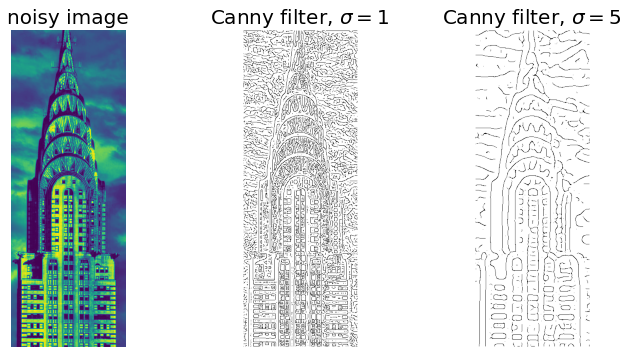

In [ ]:
im = io.imread(url).mean(2)
cannyall(im, sig=5)


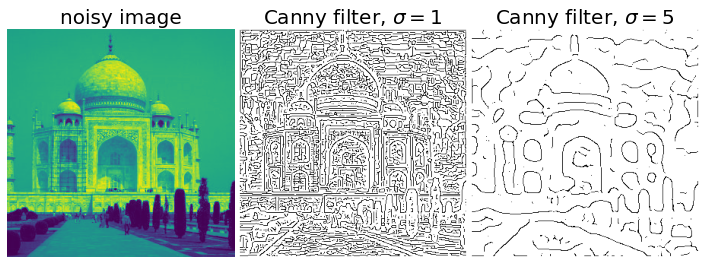

In [ ]:
im = io.imread(tgimfile).mean(2)
cannyall(im)


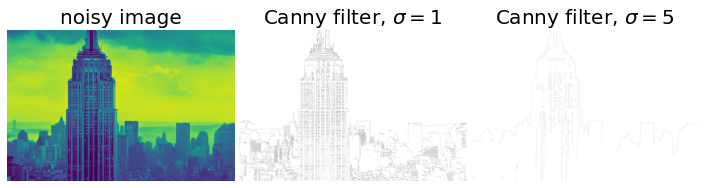

In [ ]:
im = io.imread(empimfile)
cannyall(im, sig=5)


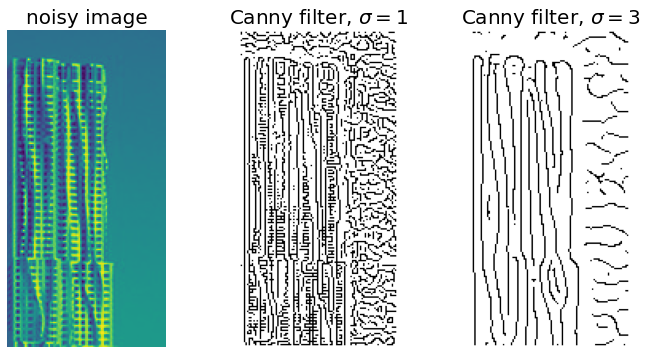

In [ ]:
im = io.imread(gehryimfile)[0:200,150:250].mean(2)
cannyall(im, sig=3)


### note that other packages work differently: for example the sobel implementation in sklearn.filters already takes care of putting the 2 dimensions together

Text(0.5, 1.0, 'sklearn sobel')

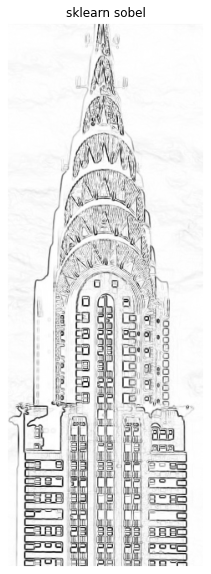

In [ ]:
from skimage.filters import sobel
showme(sobel(io.imread(url).mean(2)), cmap="Greys")
pl.title("sklearn sobel")